In [1]:
import json
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image
from clip import tokenize
from transformers import CLIPVisionModelWithProjection, CLIPTextModelWithProjection, CLIPImageProcessor

from src.data_utils import FashionIQDataset
from src.utils import extract_index_features_clip, device, extract_index_features_with_text_captions_clip
from src.validate_clip import generate_fiq_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
def compute_fiq_val_metrics_text_image_modified(
    relative_val_dataset: FashionIQDataset,
    clip_text_encoder: torch.nn.Module,
    clip_tokenizer,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on FashionIQ dataset combining text and image distances.

    :param relative_val_dataset: FashionIQ validation dataset in relative mode
    :param clip_text_encoder: CLIP text encoder
    :param clip_tokenizer: CLIP tokenizer
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    target_names = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function,
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _ = generate_fiq_val_predictions(
            clip_text_encoder,
            clip_tokenizer,
            relative_val_dataset,
            combining_function, image_index_names,
            image_index_features
        )

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[
            sorted_indices]
        labels = torch.tensor(
            sorted_index_names == np.repeat(np.array(target_names),
                                            len(image_index_names if image_index_names else multiple_text_index_names[
                                                0])).reshape(len(target_names), -1))
        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        results.append({"alpha": alpha, "recall_at10": recall_at10, "recall_at50": recall_at50})

    return pd.DataFrame(results)

In [3]:
def fashioniq_val_retrieval_text_image_modified(
    dress_type: str,
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on FashionIQ validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param clip_text_encoder: CLIP text model
    :param clip_img_encoder: CLIP image model
    :param clip_tokenizer: CLIP tokenizer
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    """

    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_index_features, multiple_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions_clip(
            classic_val_dataset,
            clip_text_encoder,
            clip_tokenizer,
            text_captions,
            i + 1
        )
        multiple_index_features.append(index_features)
        multiple_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features_clip(
        classic_val_dataset, clip_img_encoder
    )

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    return compute_fiq_val_metrics_text_image_modified(
        relative_val_dataset,
        clip_text_encoder,
        clip_tokenizer,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the CLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [4]:
CLIP_NAME = 'openai/clip-vit-large-patch14'

In [5]:
clip_text_encoder = CLIPTextModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32)
clip_text_encoder = clip_text_encoder.float().to(device)

print("clip text encoder loaded.")
clip_text_encoder.eval()

clip text encoder loaded.

CLIPTextModelWithProjection(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 768)
      (position_embedding): Embedding(77, 768)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=768, out_features=768, bias=True)
            (v_proj): Linear(in_features=768, out_features=768, bias=True)
            (q_proj): Linear(in_features=768, out_features=768, bias=True)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
          (layer_norm1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=768, out_features=3072, bias=True)
            (fc2): Linear(in_features=3072, out_features=768, bias=True)
          )
          (layer_norm2): LayerNorm(

In [6]:
clip_img_encoder = CLIPVisionModelWithProjection.from_pretrained(CLIP_NAME, torch_dtype=torch.float32)

clip_img_encoder = clip_img_encoder.float().to(device)
print("clip img encoder loaded.")
clip_img_encoder = clip_img_encoder.eval()

clip img encoder loaded.

In [7]:
print('CLIP preprocess pipeline is used')
preprocess = CLIPImageProcessor(
    crop_size={'height': 224, 'width': 224},
    do_center_crop=True,
    do_convert_rgb=True,
    do_normalize=True,
    do_rescale=True,
    do_resize=True,
    image_mean=[0.48145466, 0.4578275, 0.40821073],
    image_std=[0.26862954, 0.26130258, 0.27577711],
    resample=3,
    size={'shortest_edge': 224},
)

CLIP preprocess pipeline is used

In [8]:
clip_tokenizer = tokenize

In [9]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [10]:
combining_function_original = element_wise_sum_original

In [11]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [12]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [13]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the FashionIQ dataset</div>

In [14]:
with open('../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [15]:
def convert_to_pivot(data: List[pd.DataFrame]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :param column_name: name of the column to use as the index
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)
    
    # Create pivot tables for recall@10 and recall@50
    recall_at10 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at50')
    
    return recall_at10, recall_at50

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [16]:
grid_search_betas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    shirt_recall = fashioniq_val_retrieval_text_image_modified(
        'shirt',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"Shirt recall at 10 for beta={beta}: {shirt_recall['recall_at10'].max()}")
    print(f"Shirt recall at 50 for beta={beta}: {shirt_recall['recall_at50'].max()}")
    
    shirt_recall_list.append(shirt_recall)
    
shirt_recall_at10, shirt_recall_at50 = convert_to_pivot(shirt_recall_list)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:19<00:00,  2.52it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 22:53:13.088726] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.69it/s]


[2024-06-08 22:53:15.182872] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.61it/s]


[2024-06-08 22:53:17.428331] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.78it/s]


[2024-06-08 22:53:19.660022] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.87it/s]


Shirt recall at 10 for beta=0.0: 10.745829343795776

Shirt recall at 50 for beta=0.0: 20.215897262096405

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.64it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 22:55:18.112573] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.98it/s]


[2024-06-08 22:55:20.123081] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.75it/s]


[2024-06-08 22:55:22.361186] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.83it/s]


[2024-06-08 22:55:24.591733] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.43it/s]


Shirt recall at 10 for beta=0.05: 10.794896632432938

Shirt recall at 50 for beta=0.05: 20.90284526348114

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.59it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 22:57:23.989364] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.95it/s]


[2024-06-08 22:57:26.002586] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.88it/s]


[2024-06-08 22:57:28.227288] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.91it/s]


[2024-06-08 22:57:30.449777] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.83it/s]


Shirt recall at 10 for beta=0.1: 11.187438666820526

Shirt recall at 50 for beta=0.1: 21.83513194322586

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.61it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 22:59:31.327799] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.59it/s]


[2024-06-08 22:59:33.429068] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 26.91it/s]


[2024-06-08 22:59:35.816366] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.03it/s]


[2024-06-08 22:59:38.192859] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.05it/s]


Shirt recall at 10 for beta=0.15000000000000002: 11.727183312177658

Shirt recall at 50 for beta=0.15000000000000002: 22.816486656665802

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.65it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:01:37.196501] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.90it/s]


[2024-06-08 23:01:39.211909] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.78it/s]


[2024-06-08 23:01:41.444033] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.81it/s]


[2024-06-08 23:01:43.674359] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.76it/s]


Shirt recall at 10 for beta=0.2: 11.972521990537643

Shirt recall at 50 for beta=0.2: 23.454366624355316

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.65it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:03:41.054059] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.93it/s]


[2024-06-08 23:03:43.066548] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.41it/s]


[2024-06-08 23:03:45.293628] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.85it/s]


[2024-06-08 23:03:47.520790] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.79it/s]


Shirt recall at 10 for beta=0.25: 12.659470736980438

Shirt recall at 50 for beta=0.25: 24.190382659435272

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.65it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:05:45.284592] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.77it/s]


[2024-06-08 23:05:47.308060] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.77it/s]


[2024-06-08 23:05:49.541806] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.80it/s]


[2024-06-08 23:05:51.771855] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.85it/s]


Shirt recall at 10 for beta=0.30000000000000004: 13.444553315639496

Shirt recall at 50 for beta=0.30000000000000004: 25.85868537425995

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.65it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:07:49.652340] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.99it/s]


[2024-06-08 23:07:51.663068] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.68it/s]


[2024-06-08 23:07:53.903088] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.75it/s]


[2024-06-08 23:07:56.138087] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.71it/s]


Shirt recall at 10 for beta=0.35000000000000003: 14.131501317024231

Shirt recall at 50 for beta=0.35000000000000003: 27.526986598968506

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.59it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:09:55.386043] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.66it/s]


[2024-06-08 23:09:57.481991] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.33it/s]


[2024-06-08 23:09:59.833179] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.03it/s]


[2024-06-08 23:10:02.125649] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 25.74it/s]


Shirt recall at 10 for beta=0.4: 15.210990607738495

Shirt recall at 50 for beta=0.4: 29.440629482269287

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.60it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:12:03.913905] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.81it/s]


[2024-06-08 23:12:05.937165] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.07it/s]


[2024-06-08 23:12:08.227334] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.75it/s]


[2024-06-08 23:12:10.544162] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.26it/s]


Shirt recall at 10 for beta=0.45: 16.486752033233643

Shirt recall at 50 for beta=0.45: 31.010794639587402

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:18<00:00,  2.54it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:14:17.045802] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.93it/s]


[2024-06-08 23:14:19.193685] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.17it/s]


[2024-06-08 23:14:21.558076] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.71it/s]


[2024-06-08 23:14:23.877482] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.04it/s]


Shirt recall at 10 for beta=0.5: 18.351325392723083

Shirt recall at 50 for beta=0.5: 32.973504066467285

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:17<00:00,  2.58it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:16:30.848794] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.50it/s]


[2024-06-08 23:16:32.891095] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.54it/s]


[2024-06-08 23:16:35.143194] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.61it/s]


[2024-06-08 23:16:37.389551] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.64it/s]


Shirt recall at 10 for beta=0.55: 20.01962661743164

Shirt recall at 50 for beta=0.55: 34.98528003692627

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:17<00:00,  2.56it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:18:42.569148] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.33it/s]


[2024-06-08 23:18:44.621872] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.87it/s]


[2024-06-08 23:18:46.927874] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.21it/s]


[2024-06-08 23:18:49.206180] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.34it/s]


Shirt recall at 10 for beta=0.6000000000000001: 21.83513194322586

Shirt recall at 50 for beta=0.6000000000000001: 36.50637865066528

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:19<00:00,  2.50it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:21:00.656428] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.04it/s]


[2024-06-08 23:21:02.727865] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.95it/s]


[2024-06-08 23:21:05.027874] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.60it/s]


[2024-06-08 23:21:07.355971] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.48it/s]


Shirt recall at 10 for beta=0.65: 23.307164013385773

Shirt recall at 50 for beta=0.65: 38.861629366874695

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:17<00:00,  2.57it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:23:12.935225] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.51it/s]


[2024-06-08 23:23:14.976858] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.48it/s]


[2024-06-08 23:23:17.234126] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.46it/s]


[2024-06-08 23:23:19.492616] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.51it/s]


Shirt recall at 10 for beta=0.7000000000000001: 24.828262627124786

Shirt recall at 50 for beta=0.7000000000000001: 39.793914556503296

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.62it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:25:23.253382] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.50it/s]


[2024-06-08 23:25:25.294875] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.34it/s]


[2024-06-08 23:25:27.562186] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.42it/s]


[2024-06-08 23:25:29.824276] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.36it/s]


Shirt recall at 10 for beta=0.75: 25.41707456111908

Shirt recall at 50 for beta=0.75: 40.57900011539459

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:21<00:00,  2.45it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:27:40.286467] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.25it/s]


[2024-06-08 23:27:42.344149] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.03it/s]


[2024-06-08 23:27:44.637955] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.52it/s]


[2024-06-08 23:27:46.891696] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.21it/s]


Shirt recall at 10 for beta=0.8: 25.318941473960876

Shirt recall at 50 for beta=0.8: 40.628066658973694

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.59it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:29:52.692417] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.67it/s]


[2024-06-08 23:29:54.722256] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.13it/s]


[2024-06-08 23:29:56.928078] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.29it/s]


[2024-06-08 23:29:59.122091] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.31it/s]


Shirt recall at 10 for beta=0.8500000000000001: 24.190382659435272

Shirt recall at 50 for beta=0.8500000000000001: 39.54857587814331

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.59it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:32:03.276983] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.37it/s]


[2024-06-08 23:32:05.326744] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.53it/s]


[2024-06-08 23:32:07.661132] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.82it/s]


[2024-06-08 23:32:09.970940] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.36it/s]


Shirt recall at 10 for beta=0.9: 22.571147978305817

Shirt recall at 50 for beta=0.9: 36.40824258327484

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:19<00:00,  2.50it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:34:18.212140] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.91it/s]


[2024-06-08 23:34:20.292323] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.91it/s]


[2024-06-08 23:34:22.594611] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.22it/s]


[2024-06-08 23:34:24.871587] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.57it/s]


Shirt recall at 10 for beta=0.9500000000000001: 20.166830718517303

Shirt recall at 50 for beta=0.9500000000000001: 33.6113840341568

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:17<00:00,  2.58it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-08 23:36:30.615719] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.64it/s]


[2024-06-08 23:36:32.649929] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.43it/s]


[2024-06-08 23:36:34.910999] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.65it/s]


[2024-06-08 23:36:37.154279] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.54it/s]


Shirt recall at 10 for beta=1.0: 18.743866682052612

Shirt recall at 50 for beta=1.0: 30.716389417648315

In [17]:
shirt_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,10.500491,10.745829,10.794897,11.334642,11.825319,12.315996,12.904808,14.131501,15.112856,16.192345,...,19.627085,21.050049,23.209028,24.288519,25.024533,25.318941,24.190383,22.571148,20.166831,18.449460
0.05,10.745829,10.794897,10.942100,11.383709,11.874387,12.512267,13.444553,14.131501,15.210991,16.486752,...,20.019627,21.835132,23.307164,24.828263,25.417075,24.288519,23.356232,22.031404,20.117763,18.743867
0.10,10.451423,10.794897,11.187439,11.727183,11.972522,12.659471,13.297351,13.788028,15.014720,16.437684,...,19.528949,21.000981,22.865555,23.405299,23.601571,23.159961,22.178607,20.853779,19.627085,18.105987
0.15,10.157017,10.549559,10.794897,11.138371,11.629048,12.414131,12.904808,13.591756,15.063788,16.486752,...,19.038273,20.166831,20.951913,21.197252,22.031404,21.540727,20.412169,19.774288,18.498528,17.566241
0.20,9.715407,10.009813,10.402355,10.794897,11.285574,11.874387,12.659471,13.542689,14.573111,16.045143,...,17.958783,18.743867,19.430815,19.970560,19.970560,19.578017,18.940137,18.056919,17.566241,16.633955
0.25,9.470069,9.764475,10.206085,10.942100,11.187439,11.825319,12.512267,13.542689,14.720315,15.701668,...,17.320903,18.007851,17.762512,18.056919,17.811580,17.566241,17.173700,16.830225,16.781157,15.848872
0.30,9.421001,9.764475,10.206085,10.647694,10.794897,11.236507,12.021590,13.346419,13.935231,15.014720,...,16.290481,16.486752,16.633955,16.879293,16.437684,15.603533,15.652600,15.603533,15.358195,14.769381
0.35,9.175663,9.568204,10.009813,10.549559,10.745829,11.187439,11.678116,12.708537,13.101080,14.376840,...,14.965652,15.309127,15.603533,15.358195,15.260059,14.524043,14.376840,14.474976,14.131501,13.689892
0.40,8.832189,9.175663,9.617272,9.764475,10.402355,10.745829,11.432777,12.021590,12.904808,13.788028,...,14.229637,14.376840,14.573111,13.984299,13.591756,13.493621,13.395485,13.493621,12.806673,12.315996


In [18]:
shirt_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,20.068695,20.559372,21.295388,22.276741,23.061825,23.748773,24.926399,26.545632,27.821395,29.538763,...,33.218843,35.868499,37.782139,39.548576,40.333661,40.628067,39.548576,36.359176,33.464181,30.176643
0.05,20.215897,20.657508,21.540727,22.325809,23.110893,24.043180,25.466144,27.477920,29.244357,30.520117,...,34.789008,36.359176,38.861629,39.793915,40.579000,40.628067,39.057899,36.408243,33.611384,30.716389
0.10,20.068695,20.804711,21.835132,22.718351,23.454367,24.190383,25.613347,27.526987,29.440629,30.912659,...,34.985280,36.506379,38.174680,38.321885,38.370952,38.370952,37.291461,34.543669,32.531893,30.127576
0.15,20.215897,20.902845,21.736997,22.620216,23.454367,24.092247,25.858685,27.379784,28.949952,31.010795,...,34.396467,35.623160,36.604515,36.702651,36.113837,35.672227,34.347400,32.139352,30.372915,28.213936
0.20,20.215897,20.902845,21.786065,22.816487,23.405299,23.895976,25.662413,27.085379,28.312069,29.784101,...,33.218843,33.611384,34.052992,33.905789,33.071640,32.384691,31.403336,29.685965,28.115800,26.104024
0.25,19.283612,20.314033,21.050049,21.835132,22.718351,23.699705,24.926399,25.907752,27.330717,28.459275,...,30.667320,31.697744,32.041216,31.010795,30.716389,30.127576,28.704613,27.134445,25.711483,24.484789
0.30,19.087340,19.872424,20.608440,21.246320,21.982336,23.209028,24.631992,25.613347,26.447499,27.526987,...,29.293424,30.225712,28.802747,28.459275,27.968597,27.232581,26.251227,25.564280,24.386653,22.963689
0.35,18.400392,19.430815,20.117763,21.197252,21.884200,22.963689,24.141315,24.926399,25.466144,26.153091,...,27.477920,27.477920,26.889107,26.741904,25.564280,25.073603,24.141315,23.405299,22.865555,21.982336
0.40,18.007851,18.989205,19.578017,20.166831,21.246320,21.786065,22.865555,24.043180,24.582924,25.417075,...,25.269872,25.269872,24.877331,24.043180,23.846909,23.209028,22.473013,22.031404,21.197252,20.510304


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [19]:
grid_search_betas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    dress_recall = fashioniq_val_retrieval_text_image_modified(
        'dress',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"Dress recall at 10 for beta={beta}: {dress_recall['recall_at10'].max()}")
    print(f"Dress recall at 50 for beta={beta}: {dress_recall['recall_at50'].max()}")
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot(dress_recall_list)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.58it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:41:05.203725] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.75it/s]


[2024-06-08 23:41:07.523571] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 32.04it/s]


[2024-06-08 23:41:09.528199] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.92it/s]


[2024-06-08 23:41:11.748244] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.51it/s]


Dress recall at 10 for beta=0.0: 4.6603865921497345

Dress recall at 50 for beta=0.0: 12.84085214138031

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:42:27.919255] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.99it/s]


[2024-06-08 23:42:29.928243] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.96it/s]


[2024-06-08 23:42:32.146374] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.89it/s]


[2024-06-08 23:42:34.368938] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.90it/s]


Dress recall at 10 for beta=0.05: 4.908279702067375

Dress recall at 50 for beta=0.05: 13.534952700138092

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.57it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:43:50.904710] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.23it/s]


[2024-06-08 23:43:53.031570] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.62it/s]


[2024-06-08 23:43:55.275355] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.31it/s]


[2024-06-08 23:43:57.542962] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.38it/s]


Dress recall at 10 for beta=0.1: 5.106594040989876

Dress recall at 50 for beta=0.1: 14.476945996284485

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.58it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:45:15.923297] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.76it/s]


[2024-06-08 23:45:18.012173] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.17it/s]


[2024-06-08 23:45:20.291586] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.17it/s]


[2024-06-08 23:45:22.570616] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.36it/s]


Dress recall at 10 for beta=0.15000000000000002: 5.552801117300987

Dress recall at 50 for beta=0.15000000000000002: 15.617252886295319

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.53it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:46:40.516046] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.78it/s]


[2024-06-08 23:46:42.603891] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.73it/s]


[2024-06-08 23:46:44.920058] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.46it/s]


[2024-06-08 23:46:47.176321] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.48it/s]


Dress recall at 10 for beta=0.2: 6.246901303529739

Dress recall at 50 for beta=0.2: 16.46008938550949

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:48:04.691017] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.95it/s]


[2024-06-08 23:48:06.837177] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.62it/s]


[2024-06-08 23:48:09.161623] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.32it/s]


[2024-06-08 23:48:11.429533] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.11it/s]


Dress recall at 10 for beta=0.25: 6.941001117229462

Dress recall at 50 for beta=0.25: 17.848289012908936

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:49:28.075605] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.78it/s]


[2024-06-08 23:49:30.098256] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.31it/s]


[2024-06-08 23:49:32.338415] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.90it/s]


[2024-06-08 23:49:34.560489] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.88it/s]


Dress recall at 10 for beta=0.30000000000000004: 7.635101675987244

Dress recall at 50 for beta=0.30000000000000004: 19.53396201133728

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:50:49.704982] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.31it/s]


[2024-06-08 23:50:51.825475] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.57it/s]


[2024-06-08 23:50:54.154321] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.45it/s]


[2024-06-08 23:50:56.411672] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.43it/s]


Dress recall at 10 for beta=0.35000000000000003: 8.329201489686966

Dress recall at 50 for beta=0.35000000000000003: 20.971740782260895

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.53it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:52:14.001225] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.80it/s]


[2024-06-08 23:52:16.086833] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.40it/s]


[2024-06-08 23:52:18.348960] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.37it/s]


[2024-06-08 23:52:20.612324] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.19it/s]


Dress recall at 10 for beta=0.4: 9.41993072628975

Dress recall at 50 for beta=0.4: 22.80614823102951

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.51it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:53:38.987278] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.73it/s]


[2024-06-08 23:53:41.077780] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.81it/s]


[2024-06-08 23:53:43.386855] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.00it/s]


[2024-06-08 23:53:45.682279] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.55it/s]


Dress recall at 10 for beta=0.45: 10.857709497213364

Dress recall at 50 for beta=0.45: 24.640555679798126

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.54it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:55:02.818304] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.64it/s]


[2024-06-08 23:55:04.849243] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.45it/s]


[2024-06-08 23:55:07.105383] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.78it/s]


[2024-06-08 23:55:09.336965] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.68it/s]


Dress recall at 10 for beta=0.5: 12.493802607059479

Dress recall at 50 for beta=0.5: 26.921170949935913

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.58it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:56:25.005151] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.72it/s]


[2024-06-08 23:56:27.029816] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.61it/s]


[2024-06-08 23:56:29.274713] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.94it/s]


[2024-06-08 23:56:31.572972] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.49it/s]


Dress recall at 10 for beta=0.55: 13.931581377983093

Dress recall at 50 for beta=0.55: 29.647991061210632

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:47<00:00,  2.51it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:57:49.347454] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.32it/s]


[2024-06-08 23:57:51.466231] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.62it/s]


[2024-06-08 23:57:53.710148] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.75it/s]


[2024-06-08 23:57:55.943048] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.74it/s]


Dress recall at 10 for beta=0.6000000000000001: 15.617252886295319

Dress recall at 50 for beta=0.6000000000000001: 32.27565586566925

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-08 23:59:10.492096] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.55it/s]


[2024-06-08 23:59:12.528901] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.76it/s]


[2024-06-08 23:59:14.843753] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.15it/s]


[2024-06-08 23:59:17.124231] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 27.37it/s]


Dress recall at 10 for beta=0.65: 17.005454003810883

Dress recall at 50 for beta=0.65: 35.00247895717621

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.58it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:00:33.085460] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.87it/s]


[2024-06-09 00:00:35.100988] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.49it/s]


[2024-06-09 00:00:37.355540] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.82it/s]


[2024-06-09 00:00:39.583279] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.80it/s]


Dress recall at 10 for beta=0.7000000000000001: 18.542389571666718

Dress recall at 50 for beta=0.7000000000000001: 36.68815195560455

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.59it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:01:54.362134] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.54it/s]


[2024-06-09 00:01:56.398859] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.35it/s]


[2024-06-09 00:01:58.663823] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.76it/s]


[2024-06-09 00:02:00.896945] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.49it/s]


Dress recall at 10 for beta=0.75: 19.48438286781311

Dress recall at 50 for beta=0.75: 38.22508752346039

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.59it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:03:16.662147] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 32.09it/s]


[2024-06-09 00:03:18.665320] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.49it/s]


[2024-06-09 00:03:20.918463] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.86it/s]


[2024-06-09 00:03:23.143475] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.59it/s]


Dress recall at 10 for beta=0.8: 19.38522607088089

Dress recall at 50 for beta=0.8: 39.21665847301483

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:45<00:00,  2.65it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:04:37.266171] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 32.04it/s]


[2024-06-09 00:04:39.272475] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.71it/s]


[2024-06-09 00:04:41.492957] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.42it/s]


[2024-06-09 00:04:43.676448] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.43it/s]


Dress recall at 10 for beta=0.8500000000000001: 18.88943910598755

Dress recall at 50 for beta=0.8500000000000001: 38.472980260849

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:45<00:00,  2.64it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:05:57.473734] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.60it/s]


[2024-06-09 00:05:59.507880] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.65it/s]


[2024-06-09 00:06:01.748572] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.59it/s]


[2024-06-09 00:06:03.994545] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.83it/s]


Dress recall at 10 for beta=0.9: 17.352503538131714

Dress recall at 50 for beta=0.9: 36.39068007469177

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:45<00:00,  2.64it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:07:18.268863] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 32.45it/s]


[2024-06-09 00:07:20.249515] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.51it/s]


[2024-06-09 00:07:22.425406] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.67it/s]


[2024-06-09 00:07:24.589599] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.59it/s]


Dress recall at 10 for beta=0.9500000000000001: 15.468516945838928

Dress recall at 50 for beta=0.9500000000000001: 33.21765065193176

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:45<00:00,  2.67it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 00:08:37.574076] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 32.72it/s]


[2024-06-09 00:08:39.538963] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.56it/s]


[2024-06-09 00:08:41.710969] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.71it/s]


[2024-06-09 00:08:43.871550] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 29.76it/s]


Dress recall at 10 for beta=1.0: 13.882002234458923

Dress recall at 50 for beta=1.0: 29.647991061210632

In [20]:
dress_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,4.660387,4.908280,5.106594,5.552801,6.246901,6.941001,7.635102,8.329201,9.419931,10.857709,...,13.683689,15.617253,17.005454,18.542390,19.484383,19.385226,18.889439,17.352504,15.468517,13.882002
0.05,4.561229,4.759544,4.957858,5.503223,6.098166,6.544373,7.238473,8.329201,9.271195,10.808131,...,13.931581,15.518096,16.212197,17.798711,19.038175,18.443233,18.393654,17.154190,15.220624,13.882002
0.10,4.313337,4.610808,4.908280,5.057015,5.602380,6.296480,6.841844,7.387209,8.378781,9.766981,...,12.642539,13.733268,15.369360,16.460089,17.302924,17.104611,16.162618,15.666832,14.328210,12.642539
0.15,4.214180,4.362915,4.561229,4.759544,5.106594,5.503223,6.098166,6.891423,7.932573,9.023302,...,11.551809,12.543382,14.179474,14.328210,14.923154,14.873575,14.427367,13.683689,13.336639,11.849281
0.20,4.065444,4.115022,4.462072,4.759544,4.809123,5.156172,5.701537,6.395637,7.436787,8.428359,...,10.411502,11.254338,11.948438,12.741695,13.039167,12.940010,13.187903,12.692118,11.948438,11.254338
0.25,3.520079,3.867129,4.065444,4.412494,4.709965,4.858701,5.156172,5.949430,6.891423,7.833416,...,9.370352,10.609817,10.659395,11.254338,11.403074,11.948438,11.700545,11.452653,11.303917,10.361923
0.30,3.222608,3.767972,3.916708,4.263758,4.412494,4.511651,4.759544,5.503223,6.643530,7.337630,...,8.973724,9.469509,9.866138,10.064452,10.560238,10.461081,10.609817,10.808131,10.361923,9.915716
0.35,2.875558,3.123451,3.619236,3.817551,4.115022,4.362915,4.660387,5.205751,6.197323,7.089737,...,8.577095,8.676252,8.824988,9.519088,9.816559,9.766981,10.014874,9.965295,9.667823,9.568667
0.40,2.776401,2.825979,3.173029,3.470501,3.470501,3.867129,4.065444,4.858701,5.751115,6.494794,...,7.535944,7.932573,8.428359,8.725830,8.577095,8.924145,8.973724,9.023302,8.824988,8.477937


In [21]:
dress_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,12.741695,13.485375,14.476946,15.171047,16.162618,17.550819,18.889439,20.228061,22.359940,24.640556,...,29.647991,32.275656,35.002479,36.688152,38.225088,39.216658,38.472980,36.390680,33.217651,29.647991
0.05,12.840852,13.534953,14.129896,15.617253,16.460089,17.848289,19.533962,20.971741,22.806148,24.491820,...,29.449677,32.027763,34.110063,36.241943,36.737728,36.886466,36.688152,34.853745,32.969758,29.548836
0.10,12.791274,13.435796,14.030738,14.625682,16.261774,17.848289,18.939018,20.674269,22.409520,23.797719,...,27.912742,30.193356,31.432822,32.721865,33.068913,33.564699,33.068913,31.383243,30.094200,28.061476
0.15,12.245910,12.741695,13.485375,14.328210,15.418939,16.360933,17.649975,19.484383,21.368369,22.706990,...,26.177493,27.268219,28.507686,29.201785,29.598415,30.242935,29.152206,28.309369,26.524541,24.789292
0.20,10.808131,11.403074,12.493803,13.584532,14.625682,15.270203,16.410510,18.046604,19.781855,21.070898,...,23.797719,24.987605,25.532970,26.078334,26.772434,26.524541,25.532970,24.938026,23.500247,22.459097
0.25,10.312345,11.056024,11.948438,12.592959,13.782845,14.625682,15.518096,16.410510,17.798711,19.434804,...,21.219634,22.310361,23.401091,23.549826,23.797719,23.500247,22.459097,22.607833,21.417947,20.277640
0.30,10.064452,10.609817,11.403074,11.948438,12.940010,13.882002,14.625682,15.518096,16.707982,17.798711,...,19.385226,20.575112,20.872582,21.616262,21.616262,21.417947,20.823005,20.525533,19.682696,18.988597
0.35,9.766981,10.213188,10.907288,11.204760,12.097174,13.088746,14.080317,15.071888,15.865146,16.311353,...,17.997025,18.691126,18.790282,19.781855,19.881012,19.533962,19.533962,19.038175,18.195340,17.600396
0.40,9.320773,9.866138,10.262766,10.659395,11.303917,12.345067,12.890431,14.129896,14.724839,15.815568,...,17.055032,17.501239,17.798711,18.344076,18.492810,18.195340,18.145761,17.600396,16.955875,16.212197


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [22]:
grid_search_betas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    toptee_recall = fashioniq_val_retrieval_text_image_modified(
        'toptee',
        get_combing_function_with_beta(beta),
        clip_text_encoder,
        clip_img_encoder,
        clip_tokenizer,
        text_captions,
        preprocess
    )
    print(f"TopTee recall at 10 for beta={beta}: {toptee_recall['recall_at10'].max()}")
    print(f"TopTee recall at 50 for beta={beta}: {toptee_recall['recall_at50'].max()}")
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot(toptee_recall_list)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.63it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:10:24.933480] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.40it/s]


[2024-06-09 00:10:27.051898] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.46it/s]


[2024-06-09 00:10:29.165026] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.59it/s]


[2024-06-09 00:10:31.268564] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.60it/s]


TopTee recall at 10 for beta=0.0: 8.261091262102127

TopTee recall at 50 for beta=0.0: 16.67516529560089

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.61it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:12:14.232289] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.42it/s]


[2024-06-09 00:12:16.423146] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.26it/s]


[2024-06-09 00:12:18.550573] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.55it/s]


[2024-06-09 00:12:20.656709] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.95it/s]


TopTee recall at 10 for beta=0.05: 8.516063541173935

TopTee recall at 50 for beta=0.05: 17.440082132816315

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.63it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:14:03.616914] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.41it/s]


[2024-06-09 00:14:05.734892] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.32it/s]


[2024-06-09 00:14:07.857135] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.64it/s]


[2024-06-09 00:14:09.956531] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.65it/s]


TopTee recall at 10 for beta=0.1: 9.026007354259491

TopTee recall at 50 for beta=0.1: 18.459969758987427

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.66it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:15:51.125175] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.36it/s]


[2024-06-09 00:15:53.247171] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.45it/s]


[2024-06-09 00:15:55.360562] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.56it/s]


[2024-06-09 00:15:57.466060] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.62it/s]


TopTee recall at 10 for beta=0.15000000000000002: 9.28097888827324

TopTee recall at 50 for beta=0.15000000000000002: 19.22488510608673

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.65it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:17:41.567962] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.80it/s]


[2024-06-09 00:17:43.731707] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.88it/s]


[2024-06-09 00:17:45.887234] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.93it/s]


[2024-06-09 00:17:48.038428] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.86it/s]


TopTee recall at 10 for beta=0.2: 9.892911463975906

TopTee recall at 50 for beta=0.2: 20.652727782726288

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.60it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:19:35.633036] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.24it/s]


[2024-06-09 00:19:37.838696] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.20it/s]


[2024-06-09 00:19:40.046517] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.36it/s]


[2024-06-09 00:19:42.241044] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.40it/s]


TopTee recall at 10 for beta=0.25: 10.453850030899048

TopTee recall at 50 for beta=0.25: 21.876592934131622

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.61it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:21:26.134745] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.94it/s]


[2024-06-09 00:21:28.213980] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.50it/s]


[2024-06-09 00:21:30.398458] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.62it/s]


[2024-06-09 00:21:32.573092] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.67it/s]


TopTee recall at 10 for beta=0.30000000000000004: 11.167771369218826

TopTee recall at 50 for beta=0.30000000000000004: 23.76338541507721

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:05<00:00,  2.57it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:23:21.477136] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 27.52it/s]


[2024-06-09 00:23:23.741182] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 27.90it/s]


[2024-06-09 00:23:25.973281] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 27.78it/s]


[2024-06-09 00:23:28.214576] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 27.88it/s]


TopTee recall at 10 for beta=0.35000000000000003: 12.39163726568222

TopTee recall at 50 for beta=0.35000000000000003: 25.39520561695099

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.63it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:25:19.095916] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.01it/s]


[2024-06-09 00:25:21.241828] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.03it/s]


[2024-06-09 00:25:23.388728] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.82it/s]


[2024-06-09 00:25:25.554527] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.85it/s]


TopTee recall at 10 for beta=0.4: 13.819479942321777

TopTee recall at 50 for beta=0.4: 28.454869985580444

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.62it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:27:13.586052] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.99it/s]


[2024-06-09 00:27:15.735989] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.21it/s]


[2024-06-09 00:27:17.867938] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.15it/s]


[2024-06-09 00:27:20.003480] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.16it/s]


TopTee recall at 10 for beta=0.45: 15.75726717710495

TopTee recall at 50 for beta=0.45: 31.208565831184387

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.62it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:29:07.340024] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.86it/s]


[2024-06-09 00:29:09.498376] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.02it/s]


[2024-06-09 00:29:11.644573] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.69it/s]


[2024-06-09 00:29:13.815489] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.96it/s]


TopTee recall at 10 for beta=0.5: 17.84803718328476

TopTee recall at 50 for beta=0.5: 33.80928039550781

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.64it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:31:02.503659] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.05it/s]


[2024-06-09 00:31:04.648302] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.25it/s]


[2024-06-09 00:31:06.776970] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.25it/s]


[2024-06-09 00:31:08.905619] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.26it/s]


TopTee recall at 10 for beta=0.55: 20.601734519004822

TopTee recall at 50 for beta=0.55: 36.562979221343994

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.64it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:32:55.414428] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.00it/s]


[2024-06-09 00:32:57.562878] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.29it/s]


[2024-06-09 00:32:59.688111] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.07it/s]


[2024-06-09 00:33:01.830601] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.29it/s]


TopTee recall at 10 for beta=0.6000000000000001: 22.69250452518463

TopTee recall at 50 for beta=0.6000000000000001: 39.26568031311035

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.63it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:34:48.890335] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.87it/s]


[2024-06-09 00:34:51.049073] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.11it/s]


[2024-06-09 00:34:53.187292] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.80it/s]


[2024-06-09 00:34:55.348665] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 30.50it/s]


TopTee recall at 10 for beta=0.65: 25.59918463230133

TopTee recall at 50 for beta=0.65: 41.45843982696533

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.62it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:36:44.534988] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.04it/s]


[2024-06-09 00:36:46.679999] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.23it/s]


[2024-06-09 00:36:48.809829] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.26it/s]


[2024-06-09 00:36:50.937913] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.06it/s]


TopTee recall at 10 for beta=0.7000000000000001: 26.51708424091339

TopTee recall at 50 for beta=0.7000000000000001: 43.498215079307556

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.64it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:38:37.830683] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.01it/s]


[2024-06-09 00:38:39.977463] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.23it/s]


[2024-06-09 00:38:42.107450] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.28it/s]


[2024-06-09 00:38:44.234103] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.04it/s]


TopTee recall at 10 for beta=0.75: 27.638959884643555

TopTee recall at 50 for beta=0.75: 44.87506449222565

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.64it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:40:30.690018] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.12it/s]


[2024-06-09 00:40:32.831363] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.20it/s]


[2024-06-09 00:40:34.964095] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.22it/s]


[2024-06-09 00:40:37.094768] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.15it/s]


TopTee recall at 10 for beta=0.8: 27.536970376968384

TopTee recall at 50 for beta=0.8: 45.130035281181335

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:03<00:00,  2.63it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:42:24.047907] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.87it/s]


[2024-06-09 00:42:26.204306] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.01it/s]


[2024-06-09 00:42:28.350567] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.94it/s]


[2024-06-09 00:42:30.501866] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.10it/s]


TopTee recall at 10 for beta=0.8500000000000001: 26.007139682769775

TopTee recall at 50 for beta=0.8500000000000001: 44.51810419559479

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.61it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:44:18.717687] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.63it/s]


[2024-06-09 00:44:20.894151] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.08it/s]


[2024-06-09 00:44:23.035105] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.93it/s]


[2024-06-09 00:44:25.186600] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.99it/s]


TopTee recall at 10 for beta=0.9: 24.528302252292633

TopTee recall at 50 for beta=0.9: 42.223355174064636

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.59it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:46:15.383751] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.69it/s]


[2024-06-09 00:46:17.564166] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.00it/s]


[2024-06-09 00:46:19.711451] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.98it/s]


[2024-06-09 00:46:21.860172] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 29.08it/s]


TopTee recall at 10 for beta=0.9500000000000001: 22.13156521320343

TopTee recall at 50 for beta=0.9500000000000001: 38.90872001647949

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.59it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 00:48:10.492739] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.39it/s]


[2024-06-09 00:48:12.686183] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.93it/s]


[2024-06-09 00:48:14.839116] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.80it/s]


[2024-06-09 00:48:17.000638] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 27.99it/s]


TopTee recall at 10 for beta=1.0: 19.785822927951813

TopTee recall at 50 for beta=1.0: 35.23712456226349

In [23]:
toptee_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,8.261091,8.516064,9.026007,9.280979,9.892911,10.249873,11.065783,12.289649,13.615502,14.941357,...,19.734830,21.876593,24.069352,26.058134,27.587965,27.434981,26.007140,24.528302,21.723610,18.867925
0.05,7.955125,8.312086,8.618052,9.127996,9.841917,10.453850,11.167771,12.391637,13.819480,15.757267,...,20.601735,22.692505,25.599185,26.517084,27.638960,27.536970,25.650179,24.222335,22.131565,19.785823
0.10,8.159102,8.261091,8.720041,8.924019,9.433962,10.351861,11.116777,11.932687,13.615502,15.451300,...,19.989800,22.284548,23.916370,25.497195,26.313105,26.007140,24.579297,23.100460,21.009690,18.714942
0.15,8.057114,8.414075,8.567058,8.873024,9.280979,9.637940,10.606834,11.575726,13.054565,14.635390,...,19.428863,20.958695,22.539520,23.559408,23.355430,22.896482,22.641510,21.366650,19.785823,18.255992
0.20,7.343192,7.955125,8.312086,8.312086,9.077001,9.790923,10.453850,11.320755,12.340643,13.717490,...,17.542070,19.377868,20.193778,20.754717,21.213667,21.060683,20.448750,19.734830,18.154003,17.083120
0.25,7.139215,7.445181,7.853136,8.159102,8.618052,9.382968,10.402856,11.269760,11.575726,12.646610,...,16.420195,17.593065,18.204997,19.122897,19.479857,18.918920,18.510965,18.306985,17.083120,15.706272
0.30,6.629271,7.394186,7.547170,7.853136,8.210097,8.822030,9.382968,9.943906,10.759816,11.983681,...,15.349312,16.369200,17.236105,17.899030,17.542070,17.032127,16.726160,16.114227,14.992350,14.482407
0.35,6.323305,6.782254,7.241204,7.598164,8.210097,8.873024,9.331974,9.943906,10.453850,11.218766,...,14.227435,15.094340,15.859255,15.655278,15.859255,15.910250,15.298317,14.533402,14.176440,13.666497
0.40,5.813361,6.221316,6.731260,7.394186,7.955125,8.618052,8.924019,9.433962,9.790923,10.555839,...,13.105558,13.819480,14.380418,14.380418,14.380418,14.125445,13.768485,13.462520,13.003570,12.748598


In [24]:
toptee_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,16.573177,17.185110,18.255992,18.918920,20.193778,21.468638,22.590515,24.222335,27.027026,30.035695,...,36.053035,39.163691,41.101480,43.192250,44.875064,45.079041,44.518104,42.121366,38.551760,33.860275
0.05,16.675165,17.440082,18.459970,19.224885,20.346762,21.672615,23.457420,25.038245,27.689955,31.208566,...,36.562979,39.265680,41.458440,43.498215,44.773075,45.130035,43.855175,42.223355,38.806731,35.237125
0.10,16.369200,17.032127,18.052015,19.173890,20.652728,21.876593,23.763385,25.395206,28.454870,30.851606,...,35.543090,38.602754,40.846506,41.713411,42.937276,43.345231,42.988271,40.132585,38.908720,34.727180
0.15,16.165222,16.726160,17.644060,18.765935,20.193778,21.672615,23.406425,25.140235,27.332994,30.239674,...,35.135135,37.225905,38.755736,39.775625,40.897501,41.101480,39.826620,38.143805,35.594085,33.299336
0.20,15.349312,15.910250,17.083120,18.255992,19.428863,20.907700,22.794493,24.630290,26.568079,29.423764,...,33.350331,35.288119,36.359000,37.276900,37.888831,37.531871,35.951045,34.982151,33.299336,31.463540
0.25,14.431413,15.502295,16.216215,17.593065,18.612953,20.295767,21.774605,23.508415,25.803161,27.995920,...,31.310555,33.044365,33.503315,34.166241,34.166241,33.758286,33.554310,32.228455,30.800611,29.372770
0.30,14.329425,14.839368,15.400305,16.726160,17.491075,18.969913,20.652728,22.488527,24.222335,26.364100,...,29.678735,30.035695,31.157574,31.310555,31.565529,31.361550,30.902600,29.525751,28.811830,27.180010
0.35,13.666497,14.227435,15.094340,15.910250,17.083120,18.001020,19.938807,21.468638,23.304437,24.681285,...,27.332994,28.250891,28.658849,28.607854,28.403875,27.893931,27.689955,27.434981,26.823050,25.497195
0.40,13.105558,13.768485,14.635390,15.400305,16.165222,17.389087,19.020908,20.652728,22.233555,23.304437,...,25.242224,26.211116,26.415095,26.211116,26.109129,25.752166,25.599185,25.548190,24.783275,23.559408


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [33]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [34]:
print("Average Recall@10 for each alpha across all betas:")
average_recall_at10

Average Recall@10 for each alpha across all betas:

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,7.81,8.06,8.31,8.72,9.32,9.84,10.54,11.58,12.72,14.00,...,17.68,19.51,21.43,22.96,24.03,24.05,23.03,21.48,19.12,17.07
0.05,7.75,7.96,8.17,8.67,9.27,9.84,10.62,11.62,12.77,14.35,...,18.18,20.02,21.71,23.05,24.03,23.42,22.47,21.14,19.16,17.47
0.10,7.64,7.89,8.27,8.57,9.00,9.77,10.42,11.04,12.34,13.89,...,17.39,19.01,20.72,21.79,22.41,22.09,20.97,19.87,18.32,16.49
0.15,7.48,7.78,7.97,8.26,8.67,9.19,9.87,10.69,12.02,13.38,...,16.67,17.89,19.22,19.69,20.10,19.77,19.16,18.27,17.21,15.89
0.20,7.04,7.36,7.73,7.96,8.39,8.94,9.60,10.42,11.45,12.73,...,15.30,16.46,17.19,17.82,18.07,17.86,17.53,16.83,15.89,14.99
0.25,6.71,7.03,7.37,7.84,8.17,8.69,9.36,10.25,11.06,12.06,...,14.37,15.40,15.54,16.14,16.23,16.14,15.80,15.53,15.06,13.97
0.30,6.42,6.98,7.22,7.59,7.81,8.19,8.72,9.60,10.45,11.45,...,13.54,14.11,14.58,14.95,14.85,14.37,14.33,14.18,13.57,13.06
0.35,6.12,6.49,6.96,7.32,7.69,8.14,8.56,9.29,9.92,10.90,...,12.59,13.03,13.43,13.51,13.65,13.40,13.23,12.99,12.66,12.31
0.40,5.81,6.07,6.51,6.88,7.28,7.74,8.14,8.77,9.48,10.28,...,11.62,12.04,12.46,12.36,12.18,12.18,12.05,11.99,11.55,11.18
0.45,5.48,5.81,6.16,6.56,6.86,7.27,7.81,8.27,8.87,9.52,...,10.77,11.32,11.35,11.40,11.34,11.26,11.21,10.91,10.73,10.27


In [35]:
print("Average Recall@50 for each alpha across all betas:")
average_recall_at50

Average Recall@50 for each alpha across all betas:

,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
0.00,16.46,17.08,18.01,18.79,19.81,20.92,22.14,23.67,25.74,28.07,...,32.97,35.77,37.96,39.81,41.14,41.64,40.85,38.29,35.08,31.23
0.05,16.58,17.21,18.04,19.06,19.97,21.19,22.82,24.50,26.58,28.74,...,33.60,35.88,38.14,39.84,40.70,40.88,39.87,37.83,35.13,31.83
0.10,16.41,17.09,17.97,18.84,20.12,21.31,22.77,24.53,26.77,28.52,...,32.81,35.10,36.82,37.59,38.13,38.43,37.78,35.35,33.84,30.97
0.15,16.21,16.79,17.62,18.57,19.69,20.71,22.31,24.00,25.88,27.99,...,31.90,33.37,34.62,35.23,35.54,35.67,34.44,32.86,30.83,28.77
0.20,15.46,16.07,17.12,18.22,19.15,20.02,21.62,23.25,24.89,26.76,...,30.12,31.30,31.98,32.42,32.58,32.15,30.96,29.87,28.31,26.68
0.25,14.68,15.62,16.40,17.34,18.37,19.54,20.74,21.94,23.64,25.30,...,27.73,29.02,29.65,29.58,29.56,29.13,28.24,27.32,25.98,24.71
0.30,14.49,15.11,15.80,16.64,17.47,18.69,19.97,21.21,22.46,23.90,...,26.12,26.95,26.94,27.13,27.05,26.67,25.99,25.21,24.29,23.04
0.35,13.94,14.62,15.37,16.10,17.02,18.02,19.39,20.49,21.55,22.38,...,24.27,24.81,24.78,25.04,24.62,24.17,23.79,23.29,22.63,21.69
0.40,13.48,14.21,14.83,15.41,16.24,17.17,18.26,19.61,20.51,21.51,...,22.52,22.99,23.03,22.87,22.82,22.39,22.07,21.73,20.98,20.09
0.45,12.95,13.54,14.23,15.08,15.69,16.38,17.48,18.61,19.73,20.46,...,21.14,21.17,21.27,21.37,21.39,21.06,20.58,20.28,19.61,18.99


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [25]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

/tmp/ipykernel_677/3408074174.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [26]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

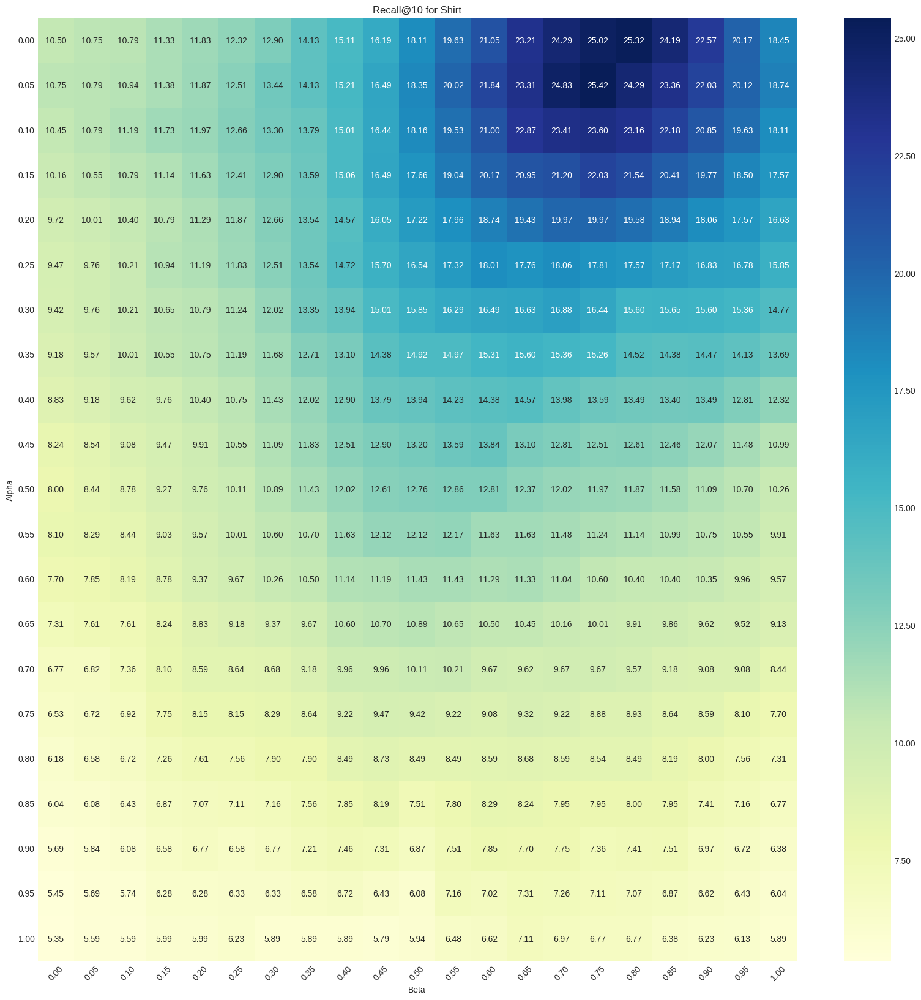

In [27]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

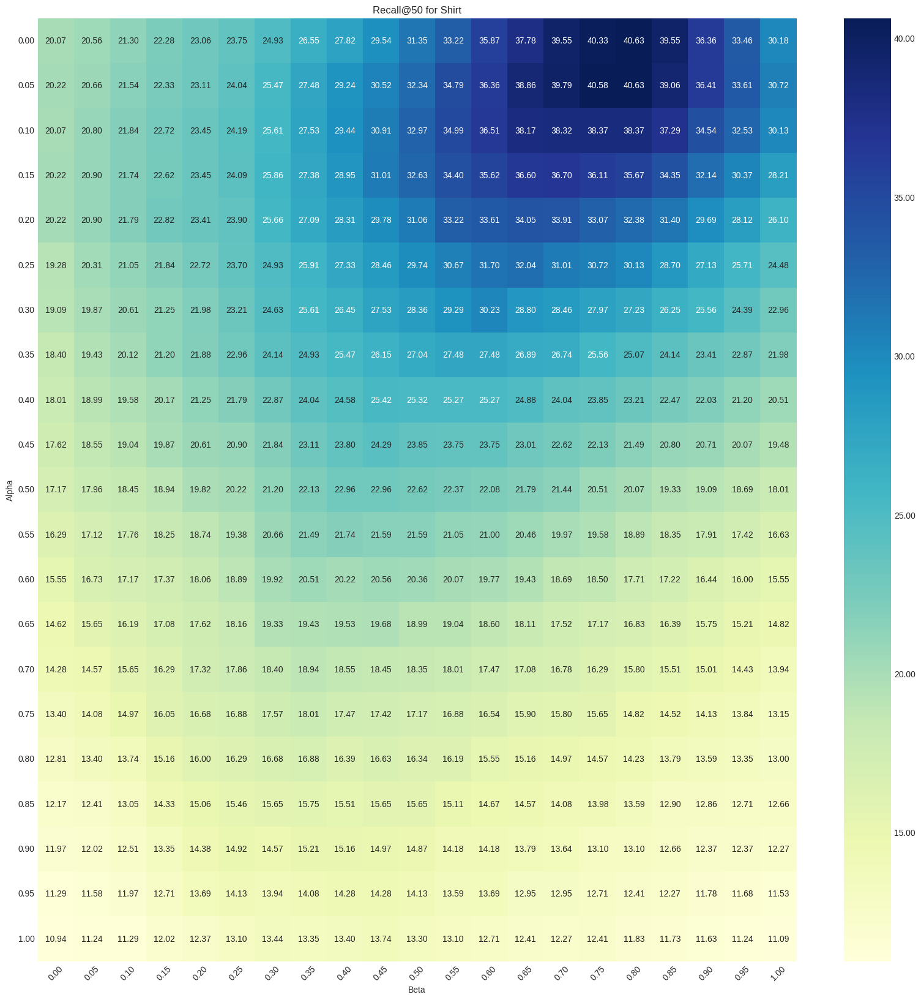

In [28]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

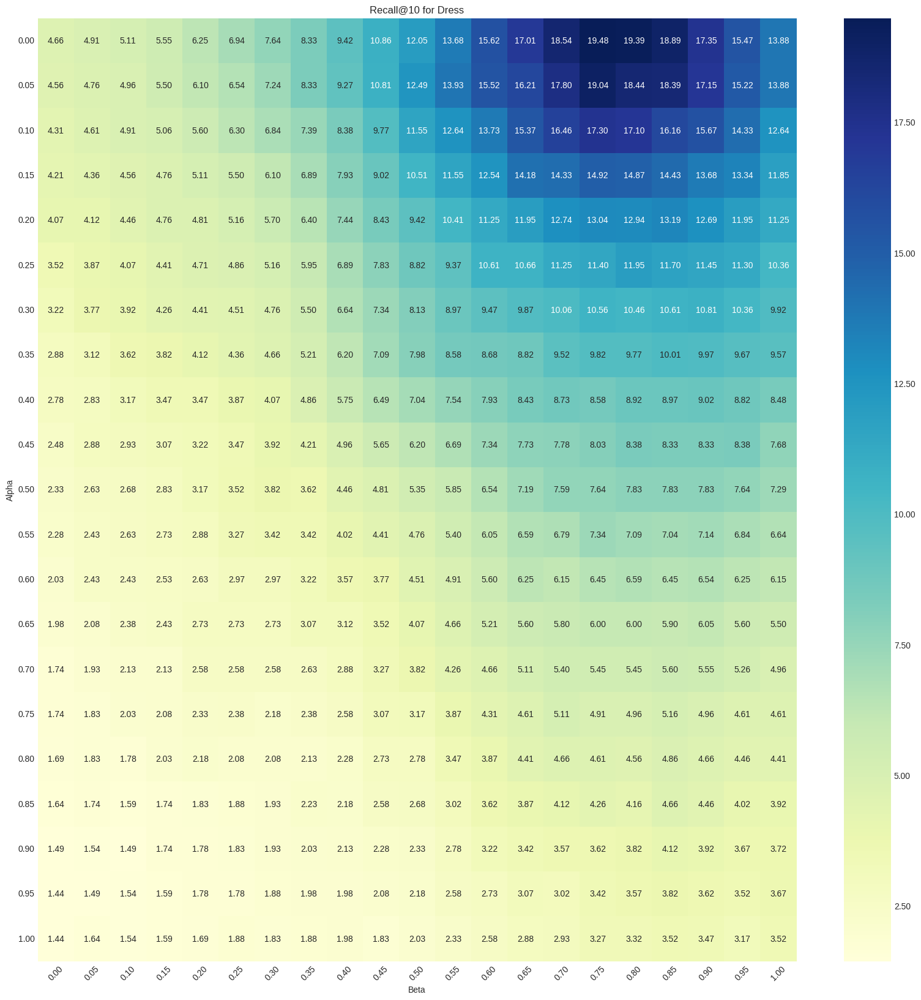

In [29]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

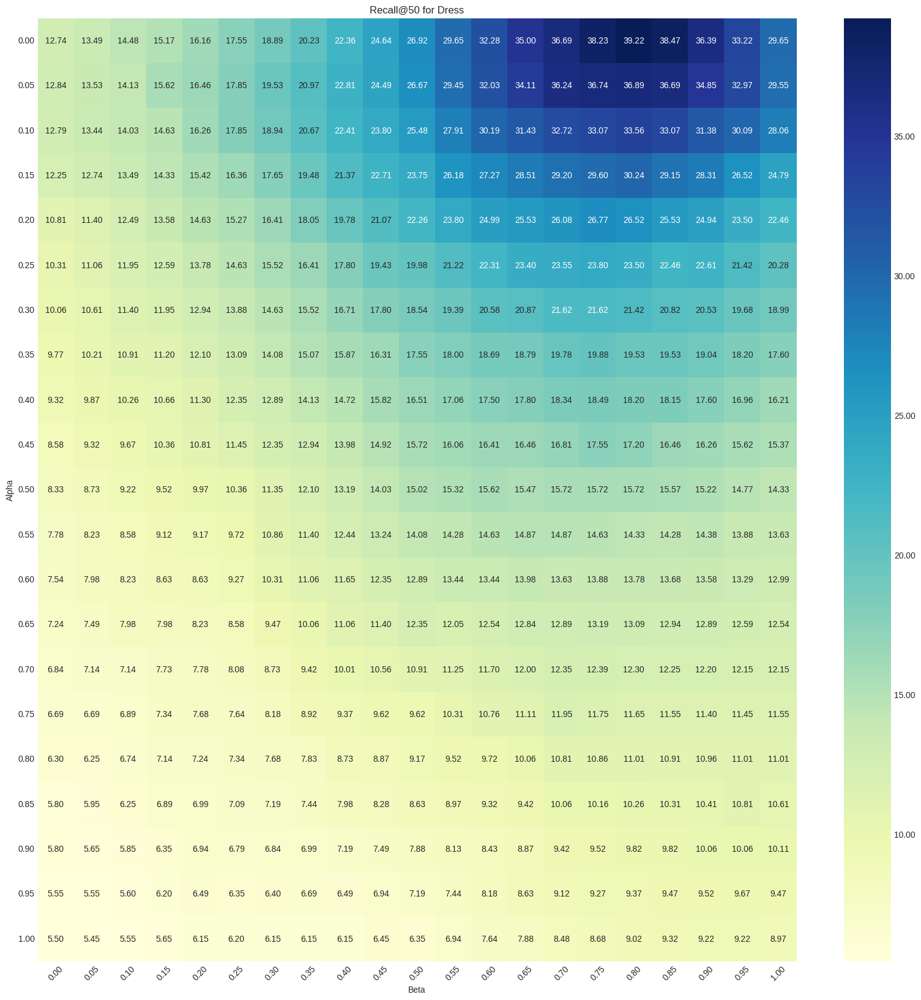

In [30]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

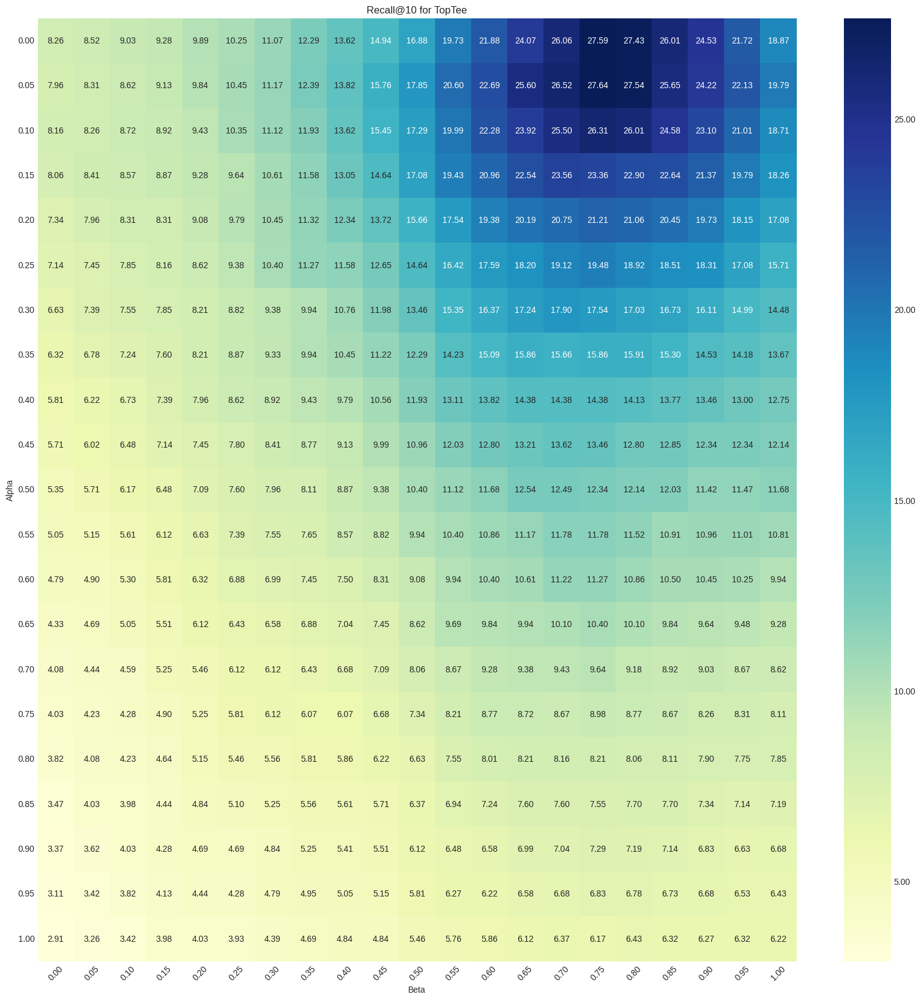

In [31]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

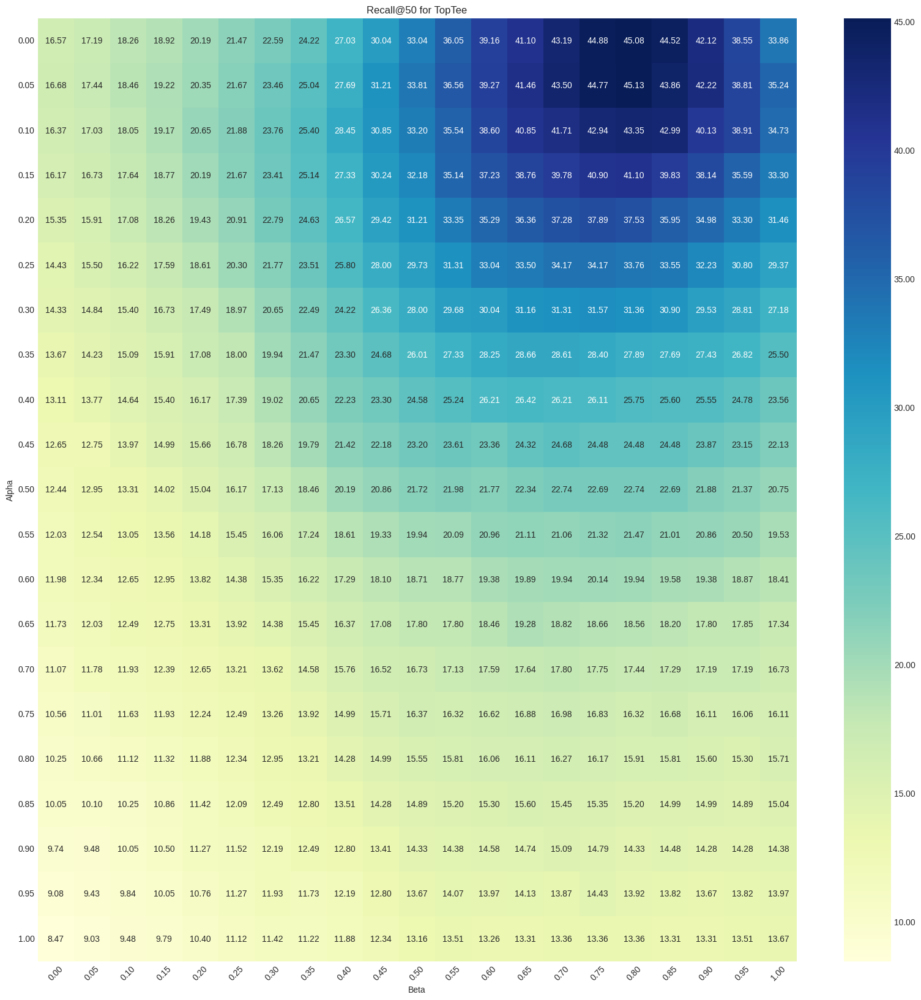

In [32]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

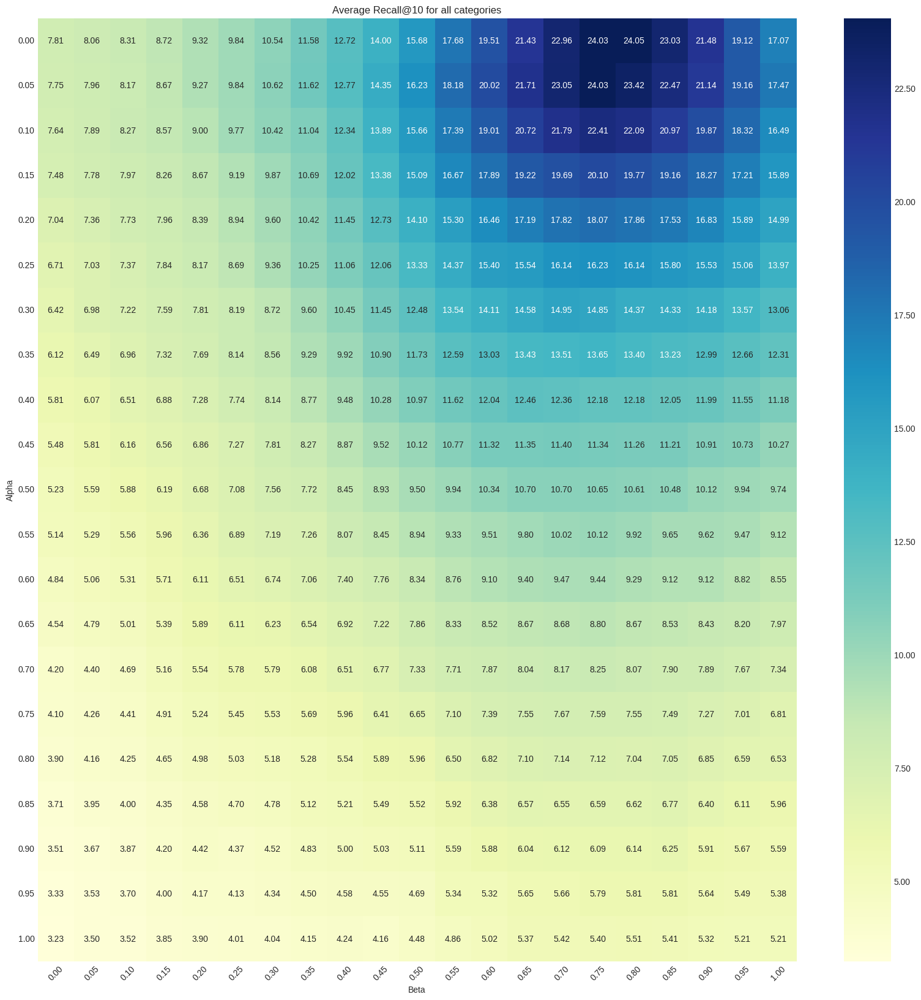

In [36]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

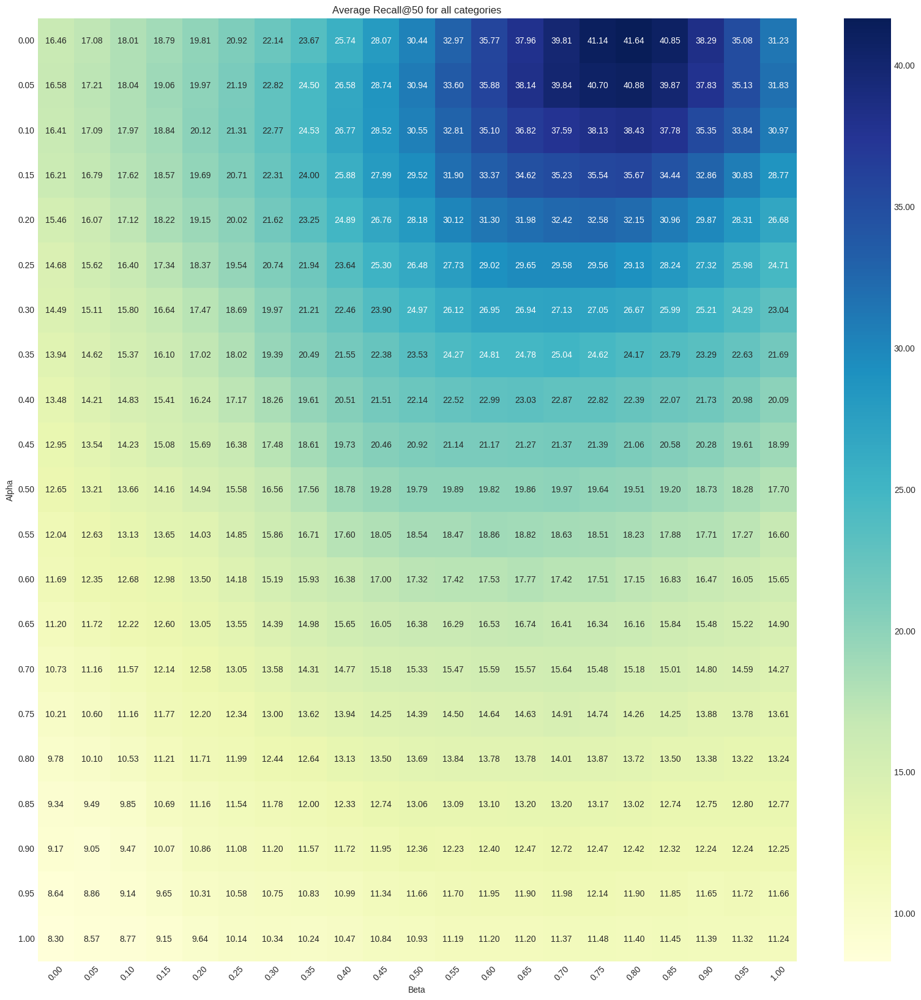

In [37]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [41]:
def compute_results(
    dress_type: str,
    combining_function: callable,
    clip_text_encoder: torch.nn.Module,
    clip_img_encoder: torch.nn.Module,
    clip_tokenizer,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
) -> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on FashionIQ dataset combining text and image distances.
    
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param clip_text_encoder: BLIP text model
    :param clip_img_encoder: BLIP image model
    :param clip_tokenizer: BLIP tokenizer
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    clip_text_encoder = clip_text_encoder.float().eval()
    clip_img_encoder = clip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_text_index_features, multiple_text_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions_clip(
            classic_val_dataset,
            clip_text_encoder,
            clip_tokenizer,
            text_captions,
            i + 1
        )
        multiple_text_index_features.append(index_features)
        multiple_text_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features_clip(
        classic_val_dataset,
        clip_img_encoder
    )

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    all_text_distances = []

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            clip_text_encoder, 
            clip_tokenizer,
            relative_val_dataset,
            combining_function, 
            text_names,
            text_features
        )
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    predicted_image_features, target_names = generate_fiq_val_predictions(
        clip_text_encoder,
        clip_tokenizer,
        relative_val_dataset,
        combining_function,
        image_index_names,
        image_index_features
    )

    # Normalize and compute distances
    image_index_features = F.normalize(image_index_features, dim=-1).float()
    image_distances = 1 - predicted_image_features @ image_index_features.T

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances

    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[
        sorted_indices]
    labels = torch.tensor(
        sorted_index_names == np.repeat(np.array(target_names),
                                        len(image_index_names if image_index_names else multiple_text_index_names[
                                            0])).reshape(len(target_names), -1))
    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100

    print(f"Recall at 10: {recall_at10}")
    print(f"Recall at 50: {recall_at50}")

    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [42]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results(
    'dress',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:46<00:00,  2.59it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 01:30:16.120904] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 30.61it/s]


[2024-06-09 01:30:18.223074] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.52it/s]


[2024-06-09 01:30:20.475624] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.65it/s]


[2024-06-09 01:30:22.717471] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.55it/s]


Recall at 10: 19.38522607088089

Recall at 50: 39.21665847301483

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [43]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results(
    'shirt',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:16<00:00,  2.60it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 01:32:24.851223] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.47it/s]


[2024-06-09 01:32:26.895854] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.22it/s]


[2024-06-09 01:32:29.173152] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.29it/s]


[2024-06-09 01:32:31.445344] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.43it/s]


Recall at 10: 25.318941473960876

Recall at 50: 40.628066658973694

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [44]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results(
    'toptee',
    get_combing_function_with_beta(0.8),
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:06<00:00,  2.55it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 01:34:18.247376] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.28it/s]


[2024-06-09 01:34:20.449944] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.24it/s]


[2024-06-09 01:34:22.654956] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.44it/s]


[2024-06-09 01:34:24.843493] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 27.56it/s]


Recall at 10: 27.434980869293213

Recall at 50: 45.07904052734375

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [45]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target = entry['target']
        candidate = entry['candidate']
        captions = entry['captions']
        if target not in ground_truths:
            ground_truths[target] = []
        ground_truths[target].append((candidate, captions))  # Store as a tuple
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [46]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_captions = ground_truths.get(ground_truth_target, [('', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(1, top_k + 2, figure=fig)
    query_img = Image.open(f'../fashionIQ_dataset/images/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    query_captions = '\n'.join(sentences for sentences in query_captions)
    ax_text.text(0.5, 0.5, query_captions, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../fashionIQ_dataset/images/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [47]:
ground_truth_dress = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.toptee.val.json')))

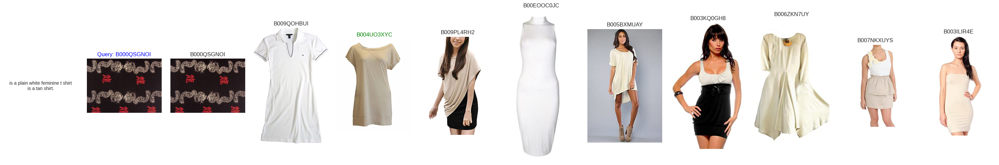

In [48]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=3)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0, and without weighted merge beta</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category with alpha=0 and without weighted merge beta</div>

In [49]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results(
    'dress',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:45<00:00,  2.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-06-09 01:35:43.275408] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.33it/s]


[2024-06-09 01:35:45.513939] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.71it/s]


[2024-06-09 01:35:47.751377] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.74it/s]


[2024-06-09 01:35:49.985961] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.66it/s]


Recall at 10: 12.047595530748367

Recall at 50: 26.921170949935913

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category with alpha=0 and without weighted merge beta</div>

In [50]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results(
    'shirt',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:15<00:00,  2.62it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-06-09 01:37:52.248763] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 31.20it/s]


[2024-06-09 01:37:54.312410] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.17it/s]


[2024-06-09 01:37:56.595262] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.10it/s]


[2024-06-09 01:37:58.883727] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:02<00:00, 28.23it/s]


Recall at 10: 18.105986714363098

Recall at 50: 31.35426938533783

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category with alpha=0 and without weighted merge beta</div>

In [51]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results(
    'toptee',
    combining_function_original,
    clip_text_encoder,
    clip_img_encoder,
    clip_tokenizer,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [01:04<00:00,  2.59it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-06-09 01:39:45.657774] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.45it/s]


[2024-06-09 01:39:47.850460] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.46it/s]


[2024-06-09 01:39:50.039020] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.34it/s]


[2024-06-09 01:39:52.236376] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:02<00:00, 28.31it/s]


Recall at 10: 16.879142820835114

Recall at 50: 33.04436504840851

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [52]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [53]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(231, [1, 3, 11, 12, 16, 34, 35, 36, 39, 63])

In [54]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(73, [6, 111, 135, 140, 169, 215, 218, 227, 301, 414])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [55]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(240, [6, 8, 19, 20, 26, 34, 44, 52, 55, 69])

In [56]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(91, [10, 28, 66, 84, 117, 123, 133, 138, 184, 213])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [57]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(280, [9, 18, 20, 26, 28, 33, 39, 40, 41, 49])

In [58]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(76, [0, 24, 32, 64, 117, 132, 196, 220, 243, 278])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

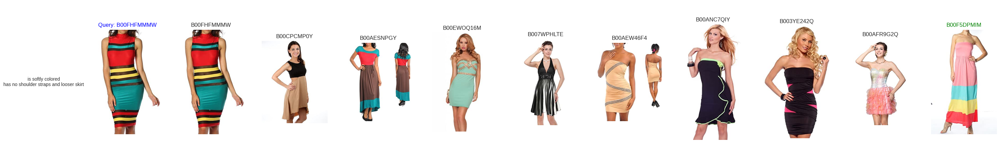

In [63]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=11)

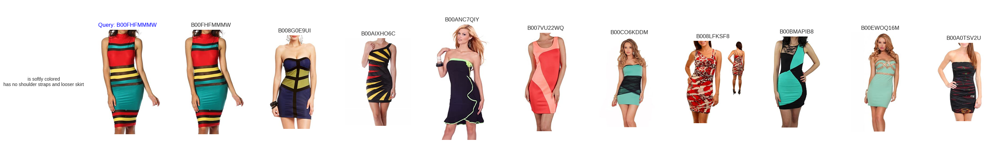

In [64]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=11)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

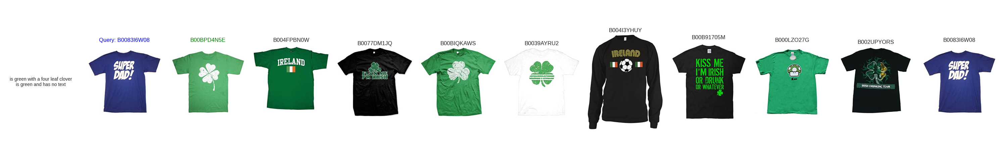

In [61]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1)

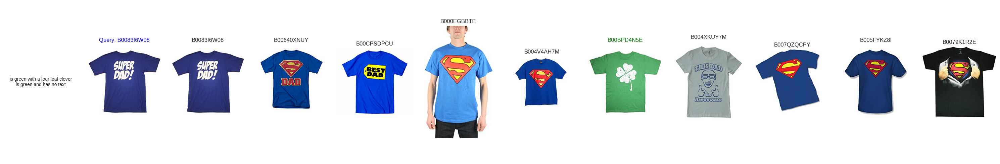

In [62]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

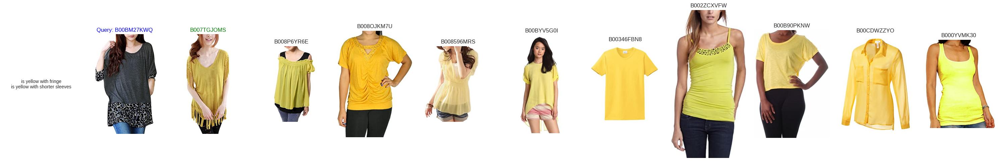

In [65]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2)

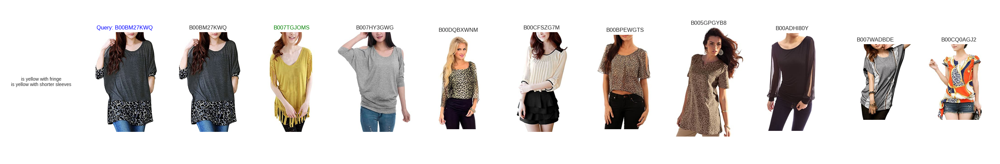

In [66]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2)